In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

In [2]:
data = pd.read_csv('./Data/DatasetFinal.csv')
data

,role,born,total_join_year,join_year,skill_set,development,culture,outstanding,attitude,total_mark,grade,return_rate,department,salary
0,Assembler,1990,11,2012,2,5,3,2,3,62,B+,124,Financial,7192
1,Credit Analyst,1987,14,2009,2,2,3,1,2,39,G,100,IT,6700
2,Data Scientist,1994,7,2016,2,2,2,1,2,38,G,100,IT,4600
3,Cloud Solutions Architect,1992,9,2014,1,3,3,1,1,32,G,100,Financial,5200
4,Risk Analyst,1979,22,2001,2,2,3,2,1,38,G,100,Marketing,9100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34107,Content Marketing,1996,5,2018,1,2,2,2,1,32,G,100,Marketing,4000
34108,IT Support Specialist,1994,7,2016,1,4,1,1,1,41,B,102,IT,4692
34109,Email Marketing Specialist,1991,10,2013,4,2,3,2,1,46,B,103,Marketing,5665
34110,UX/UI Designer,1984,17,2006,4,4,3,1,3,72,A-,160,IT,12160


In [3]:
label_encoder = LabelEncoder()
data['roleId'] = label_encoder.fit_transform(data['role'])
data['performance'] = data['return_rate']

In [4]:
class Display:
    def draw(df,x,y):
        fig = px.scatter_3d(df,x=x,y=y,z='salary',color=x,
                            size='salary',title=f"Salary Matrix" )
        fig.show()

In [6]:
Display.draw(data,x='performance', y='role')

In [7]:
Display.draw(data,x='total_join_year', y='role')

In [8]:
Display.draw(data,x='total_join_year', y='performance')

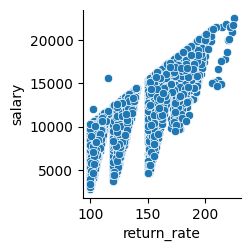

In [10]:
sns.pairplot(y_vars = 'salary', x_vars = 'return_rate' ,data = data)

In [11]:
features = [ 'return_rate', 'roleId', 'total_join_year'  ]
target_variable = 'salary'

In [12]:
X_train = data[features]
y_train = data[target_variable]

In [13]:
X_temp, X_test, y_temp, y_test = train_test_split(X_train, y_train, test_size=0.2, random_state=42)
X_train, X_valid, y_train, y_valid = train_test_split(X_temp, y_temp, test_size=0.25, random_state=42)

In [16]:
model = Sequential([
    Dense(64, input_shape=(3,), activation='relu'),
    Dense(32, activation='relu'),
    Dense(16, activation='relu'),
    Dense(1, activation='linear') 
])

model.compile(optimizer='adam', loss='mean_squared_error')

model.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 64)                256       
                                                                 
 dense_5 (Dense)             (None, 32)                2080      
                                                                 
 dense_6 (Dense)             (None, 16)                528       
                                                                 
 dense_7 (Dense)             (None, 1)                 17        
                                                                 
Total params: 2881 (11.25 KB)
Trainable params: 2881 (11.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [17]:
model.fit(X_train, y_train, epochs=500, batch_size=64, validation_data=(X_valid, y_valid))

Epoch 1/500


2023-11-04 18:14:47.230417: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


320/320 [==============================] - ETA: 0s - loss: 27292280.0000

2023-11-04 18:14:51.163154: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


320/320 [==============================] - 5s 11ms/step - loss: 27292280.0000 - val_loss: 4678948.5000
Epoch 2/500
320/320 [==============================] - 2s 5ms/step - loss: 3924129.7500 - val_loss: 3120744.7500
Epoch 3/500
320/320 [==============================] - 2s 5ms/step - loss: 2329130.5000 - val_loss: 1587932.0000
Epoch 4/500
320/320 [==============================] - 2s 5ms/step - loss: 1122735.1250 - val_loss: 859119.8750
Epoch 5/500
320/320 [==============================] - 2s 5ms/step - loss: 759325.8750 - val_loss: 758219.3750
Epoch 6/500
320/320 [==============================] - 2s 5ms/step - loss: 710991.8125 - val_loss: 726280.9375
Epoch 7/500
320/320 [==============================] - 2s 5ms/step - loss: 685017.7500 - val_loss: 700094.6875
Epoch 8/500
320/320 [==============================] - 2s 5ms/step - loss: 656199.7500 - val_loss: 678618.1875
Epoch 9/500
320/320 [==============================] - 2s 5ms/step - loss: 634294.3750 - val_loss: 652858.2500
Epoc

320/320 [==============================] - 2s 5ms/step - loss: 9421.1172 - val_loss: 10031.3506
Epoch 76/500
320/320 [==============================] - 2s 5ms/step - loss: 9116.3203 - val_loss: 12603.4150
Epoch 77/500
320/320 [==============================] - 2s 5ms/step - loss: 8743.2832 - val_loss: 8040.8403
Epoch 78/500
320/320 [==============================] - 2s 5ms/step - loss: 7469.2466 - val_loss: 12609.4238
Epoch 79/500
320/320 [==============================] - 2s 5ms/step - loss: 7514.7056 - val_loss: 7894.9375
Epoch 80/500
320/320 [==============================] - 2s 5ms/step - loss: 6525.7495 - val_loss: 7077.2949
Epoch 81/500
320/320 [==============================] - 2s 5ms/step - loss: 6533.2178 - val_loss: 10297.5957
Epoch 82/500
320/320 [==============================] - 2s 5ms/step - loss: 6284.5083 - val_loss: 5959.2837
Epoch 83/500
320/320 [==============================] - 2s 5ms/step - loss: 6025.8926 - val_loss: 7867.2778
Epoch 84/500
320/320 [===============

320/320 [==============================] - 2s 5ms/step - loss: 1385.4391 - val_loss: 1241.2499
Epoch 151/500
320/320 [==============================] - 2s 5ms/step - loss: 1512.7610 - val_loss: 1456.3690
Epoch 152/500
320/320 [==============================] - 2s 5ms/step - loss: 1550.7715 - val_loss: 1513.3173
Epoch 153/500
320/320 [==============================] - 2s 5ms/step - loss: 1476.9609 - val_loss: 1219.6162
Epoch 154/500
320/320 [==============================] - 2s 5ms/step - loss: 1588.2964 - val_loss: 1291.4998
Epoch 155/500
320/320 [==============================] - 2s 5ms/step - loss: 1576.2350 - val_loss: 2168.0105
Epoch 156/500
320/320 [==============================] - 2s 5ms/step - loss: 1727.2723 - val_loss: 1198.0488
Epoch 157/500
320/320 [==============================] - 2s 5ms/step - loss: 1429.8236 - val_loss: 1137.9086
Epoch 158/500
320/320 [==============================] - 2s 5ms/step - loss: 1594.1841 - val_loss: 1181.3990
Epoch 159/500
320/320 [==========

320/320 [==============================] - 2s 5ms/step - loss: 1154.3385 - val_loss: 839.7964
Epoch 226/500
320/320 [==============================] - 2s 5ms/step - loss: 1234.6759 - val_loss: 3051.5032
Epoch 227/500
320/320 [==============================] - 2s 5ms/step - loss: 1216.9414 - val_loss: 1474.0488
Epoch 228/500
320/320 [==============================] - 2s 5ms/step - loss: 1015.6940 - val_loss: 836.9164
Epoch 229/500
320/320 [==============================] - 2s 5ms/step - loss: 1100.9554 - val_loss: 902.0635
Epoch 230/500
320/320 [==============================] - 2s 5ms/step - loss: 1232.1431 - val_loss: 948.6725
Epoch 231/500
320/320 [==============================] - 2s 5ms/step - loss: 996.5389 - val_loss: 1668.3158
Epoch 232/500
320/320 [==============================] - 2s 5ms/step - loss: 1115.8406 - val_loss: 1633.8892
Epoch 233/500
320/320 [==============================] - 2s 5ms/step - loss: 1097.3834 - val_loss: 931.7045
Epoch 234/500
320/320 [================

320/320 [==============================] - 2s 5ms/step - loss: 956.2977 - val_loss: 1544.7292
Epoch 301/500
320/320 [==============================] - 2s 5ms/step - loss: 1076.5522 - val_loss: 828.5442
Epoch 302/500
320/320 [==============================] - 2s 5ms/step - loss: 1171.3690 - val_loss: 870.0688
Epoch 303/500
320/320 [==============================] - 2s 5ms/step - loss: 1004.9003 - val_loss: 1117.7928
Epoch 304/500
320/320 [==============================] - 2s 5ms/step - loss: 1101.3820 - val_loss: 849.5821
Epoch 305/500
320/320 [==============================] - 2s 5ms/step - loss: 1257.3196 - val_loss: 2333.0791
Epoch 306/500
320/320 [==============================] - 2s 5ms/step - loss: 1015.4814 - val_loss: 984.2896
Epoch 307/500
320/320 [==============================] - 2s 5ms/step - loss: 1149.1753 - val_loss: 2517.9539
Epoch 308/500
320/320 [==============================] - 2s 5ms/step - loss: 1120.6455 - val_loss: 746.1500
Epoch 309/500
320/320 [================

320/320 [==============================] - 2s 5ms/step - loss: 1149.4023 - val_loss: 1409.6426
Epoch 376/500
320/320 [==============================] - 2s 5ms/step - loss: 1095.8110 - val_loss: 816.2112
Epoch 377/500
320/320 [==============================] - 2s 5ms/step - loss: 1231.1378 - val_loss: 1142.1171
Epoch 378/500
320/320 [==============================] - 2s 5ms/step - loss: 1184.1971 - val_loss: 723.4417
Epoch 379/500
320/320 [==============================] - 2s 5ms/step - loss: 971.4016 - val_loss: 767.1915
Epoch 380/500
320/320 [==============================] - 2s 5ms/step - loss: 1056.2394 - val_loss: 1245.4479
Epoch 381/500
320/320 [==============================] - 2s 5ms/step - loss: 1107.0979 - val_loss: 1040.3029
Epoch 382/500
320/320 [==============================] - 2s 5ms/step - loss: 1048.8816 - val_loss: 869.2156
Epoch 383/500
320/320 [==============================] - 2s 5ms/step - loss: 1001.2816 - val_loss: 772.9537
Epoch 384/500
320/320 [================

320/320 [==============================] - 2s 5ms/step - loss: 972.2102 - val_loss: 733.5916
Epoch 451/500
320/320 [==============================] - 2s 5ms/step - loss: 1070.9279 - val_loss: 930.2295
Epoch 452/500
320/320 [==============================] - 2s 5ms/step - loss: 1187.4467 - val_loss: 869.4194
Epoch 453/500
320/320 [==============================] - 2s 5ms/step - loss: 1018.8907 - val_loss: 2088.6812
Epoch 454/500
320/320 [==============================] - 2s 5ms/step - loss: 1081.7142 - val_loss: 2148.6929
Epoch 455/500
320/320 [==============================] - 2s 5ms/step - loss: 1032.1674 - val_loss: 770.7770
Epoch 456/500
320/320 [==============================] - 2s 5ms/step - loss: 1028.6327 - val_loss: 1312.4989
Epoch 457/500
320/320 [==============================] - 2s 5ms/step - loss: 1013.9864 - val_loss: 1065.4402
Epoch 458/500
320/320 [==============================] - 2s 5ms/step - loss: 1267.5979 - val_loss: 1449.4756
Epoch 459/500
320/320 [===============

In [18]:
predicted_salary = model.predict(X_test)

2023-11-04 18:44:54.005485: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:114] Plugin optimizer for device_type GPU is enabled.


214/214 [==============================] - 1s 2ms/step


In [19]:
from sklearn.metrics import r2_score

r_squared = r2_score(y_test, predicted_salary)
print("R-squared:", str(r_squared*100) + "%")

R-squared: 99.99006827526145%


In [20]:
Role = 34
KPI_Performance = 120
original_value = label_encoder.inverse_transform([Role])
for i in range(1, 11):
    input_data = np.array([[KPI_Performance, Role, i]])
    predicted_salary_new = model.predict(input_data)
    print("Predicted salary for " + original_value +" year " + str(i) + " if performance " + str(KPI_Performance), predicted_salary_new)

1/1 [==============================] - 0s 375ms/step
['Predicted salary for Software Developer year 1 if performance 120'] [[3522.9727]]
1/1 [==============================] - 0s 10ms/step
['Predicted salary for Software Developer year 2 if performance 120'] [[3827.4785]]
1/1 [==============================] - 0s 9ms/step
['Predicted salary for Software Developer year 3 if performance 120'] [[4131.9844]]
1/1 [==============================] - 0s 9ms/step
['Predicted salary for Software Developer year 4 if performance 120'] [[4436.491]]
1/1 [==============================] - 0s 9ms/step
['Predicted salary for Software Developer year 5 if performance 120'] [[4740.997]]
1/1 [==============================] - 0s 8ms/step
['Predicted salary for Software Developer year 6 if performance 120'] [[5076.391]]
1/1 [==============================] - 0s 9ms/step
['Predicted salary for Software Developer year 7 if performance 120'] [[5474.6694]]
1/1 [==============================] - 0s 9ms/step
['Pr

In [21]:
model.save('salary_model.h5')

/Users/leechongkeat/miniforge3/envs/deep-learning/lib/python3.9/site-packages/keras/src/engine/training.py:3000: UserWarning:

You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

